In [1]:
'''
author: Yike Xie
data: 9/2023
content: brightfiled images with cell area as supplementary
'''

'\nauthor: Yike Xie\ndata: 9/2023\ncontent: brightfiled images with cell area as supplementary\n'

In [2]:
import os
import numpy as np
import pandas as pd

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import rcParams
import seaborn as sns

import scanpy as sc
import pickle

import cv2

In [3]:
def sig_dataset(feas_fn, data_fn):
    print('load features')
    with open(feas_fn, 'rb') as f:
        features = pd.read_pickle(f)
    
    print('load dataset')
    adata = sc.read_h5ad(data_fn)
    sc.pp.normalize_total(adata, target_sum=1e6)

    print('filter genes')
    sc.pp.filter_genes(adata, min_cells=10)

    print('Add features to adata')
    for col in features.columns:
        adata.obs[col] = features.loc[adata.obs_names][col]

    return adata

In [4]:
# load dataset
feas_fn = '/home/yike/phd/cancer_cells_img_seq/figures/combine_features.pkl'
data_fn = '/home/yike/phd/cancer_cells_img_seq/data/combine_gene.h5ad'
adata = sig_dataset(feas_fn, data_fn)

# add average optical intensity to adata
df = pd.DataFrame(index=adata.obs_names, columns=adata.obs['wavelengths'].iloc[0])
for i in df.index:
    df.loc[i] = adata.obs['spectra'].loc[i] / adata.obs['area'].loc[i]
    
for col in df.columns:
    adata.obs['{}_{}'.format(col[0], col[1])] = df.loc[adata.obs_names][col]

load features
load dataset
filter genes
Add features to adata


/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  df_sub[k].cat.remove_unused_categories(inplace=True)


In [5]:
# add brightfield images to npz files

if False:
    png_fdn = '/home/yike/phd/cancer_cells_img_seq/data/20220201_imaging/brightfield/'
    hyper_fdn = '/home/yike/phd/cancer_cells_img_seq/figures/segmentation/figures/'
    cropped_cells = '/home/yike/phd/cancer_cells_img_seq/figures/segmentation/cancer100cells/'

    grids = [i for i in os.listdir(png_fdn) if '.png' in i]

    for grid in grids:
        sample = plt.imread(os.path.join(png_fdn, grid))
        # bottom width
        v_white = (sample[:, :, 0] == 1).sum(axis=0)
        bottom_w = int(v_white[v_white.argmin()])
        # left or right width
        h_white = (sample[:, :, 0] == 1).sum(axis=1)
        side_w = int(h_white[h_white.argmin()] / 2)
        # cropped sample
        cropped_sample = sample[:-bottom_w, side_w: -side_w,:]
        # resize the image with factor as 4 to shape (4096, 4096)
        cropped_sample_4 = cv2.resize(cropped_sample, None, fx = 4, fy = 4)
        plt.imsave(png_fdn + 'adjusted/{}'.format(grid), cropped_sample_4)

        names = adata.obs[adata.obs['grid'] == grid.split('.')[0]].index
        for name in names:
            # load the roughly cropped cells in a whole figure
            hyper = np.load(os.path.join(hyper_fdn, '{}.npz'.format(name)))
            raw = dict(hyper.items())

            # add the brightefiled image to each cell
            raw['brightfield'] = cropped_sample_4
            # save the npz file with brightfield image
            np.savez_compressed(os.path.join(hyper_fdn, '{}.npz'.format(name)), **raw)

            # crop and add it into the npz file of cropped single cells
            seg = raw['segmentation']
            print('find ROI...')
            i0s = seg.any(axis=1).nonzero()[0]
            i1s = seg.any(axis=0).nonzero()[0]
            i00, i01 = i0s[0], i0s[-1] + 1
            i10, i11 = i1s[0], i1s[-1] + 1

            print('add margins...')
            if 'G7_S57' in name:
                margin_px = 60
            else:
                margin_px = 30
            i00 = max(0, i00 - margin_px)
            i10 = max(0, i10 - margin_px)
            i01 = min(seg.shape[0], i01 + margin_px)
            i11 = min(seg.shape[1], i11 + margin_px)

            print('crop brightfield...')
            cropped_cell = np.load(os.path.join(cropped_cells, '{}.npz'.format(name)))
            img_dict = dict(cropped_cell.items())
            img_dict['brightfield'] = raw['brightfield'][i00: i01, i10: i11]

            print('save croped control to file...')
            np.savez_compressed(os.path.join(cropped_cells, '{}.npz'.format(name)), **img_dict)

 ## supplementary with size in brightfield 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


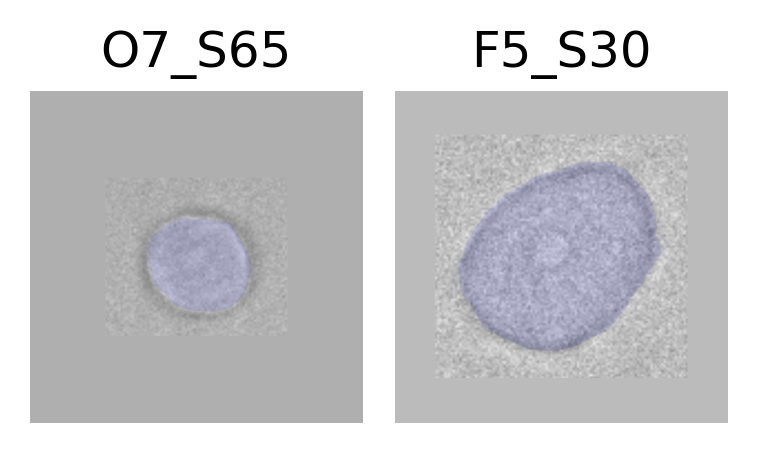

In [8]:
# schematic in main figure
npz_fdn = '/home/yike/phd/cancer_cells_img_seq/figures/segmentation/cancer100cells/'
save_path = '/home/yike/phd/cancer_cells_img_seq/docs/hyperspectral_sequencing_ewa/figures/figure1/'

fig, axs = plt.subplots(1, 2, figsize=(3, 1.5), dpi=300, sharex=True, sharey=True)    
rcParams['pdf.fonttype'] = 42
length = 600

for ax, i in zip(axs, [9, -6]):
    fn = adata.obs['area'].sort_values().index[i] + '.npz'
    image = np.load(npz_fdn + fn)
    sample = fn.split('.')[0]
    mask_o = image['new_segmentation'].copy()
    bf_o = image['brightfield'].copy()
    
    # width and height of the original figure
    w, h = mask_o.shape
    
    # width range
    mw1 = int(length/2 - round(w/2))
    mw2 = int(mw1 + w)
    # height range
    mh1 = int(length/2 - round(h/2))
    mh2 = int(mh1 + h)
    
    # create a template for brightfield
    # color is defined as average of brightfield
    bf = np.empty((length, length, 3))
    for i in range(3):
        bf[:, :, i] = bf_o[:, :, i].mean()

    # replace the brightfield template with cell
    bf[mw1: mw2, mh1: mh2, :] = bf_o
    
    # create a template for mask
    mask = np.zeros([length, length, 4])
    mask[mw1: mw2, mh1: mh2, 2][mask_o] = 255 # blue
    mask[mw1: mw2, mh1: mh2, 3][mask_o] = 0.1 # transparency
    
    ax.imshow(bf) # 
    ax.imshow(mask)
    
    ax.set_title(fn.split('.')[0])
    
    ax.axis('off')
    
plt.subplots_adjust(wspace=0.1)

fig.savefig('/home/yike/phd/cancer_cells_img_seq/docs/hyperspectral_sequencing_ewa/figures/figure2/' + 'schematic2.pdf')

In [6]:
def adjusted_cropped_cell(npz_fdn, sample, length):
    if 'batch_202306' in npz_fdn:
        sample = sample.split('_')[0]
        
    image = np.load(npz_fdn + sample + '.npz')
    
    mask_o = image['new_segmentation'].copy()
    bf_o = image['brightfield'].copy()

    # width and height of the original figure
    w, h = mask_o.shape

    # width range
    mw1 = int(length/2 - round(w/2))
    mw2 = int(mw1 + w)
    # height range
    mh1 = int(length/2 - round(h/2))
    mh2 = int(mh1 + h)

    # create a template for brightfield
    # color is defined as average of brightfield
    bf = np.empty((length, length, 3))
    for i in range(3):
        bf[:, :, i] = bf_o[:, :, i].mean()

    # replace the brightfield template with cell
    bf[mw1: mw2, mh1: mh2, :] = bf_o

    # create a template for mask
    mask = np.zeros([length, length, 4])
    mask[mw1: mw2, mh1: mh2, 2][mask_o] = 1 # blue
    mask[mw1: mw2, mh1: mh2, 3][mask_o] = 0.1 # transparency

    return {'bf': bf, 'mask': mask}

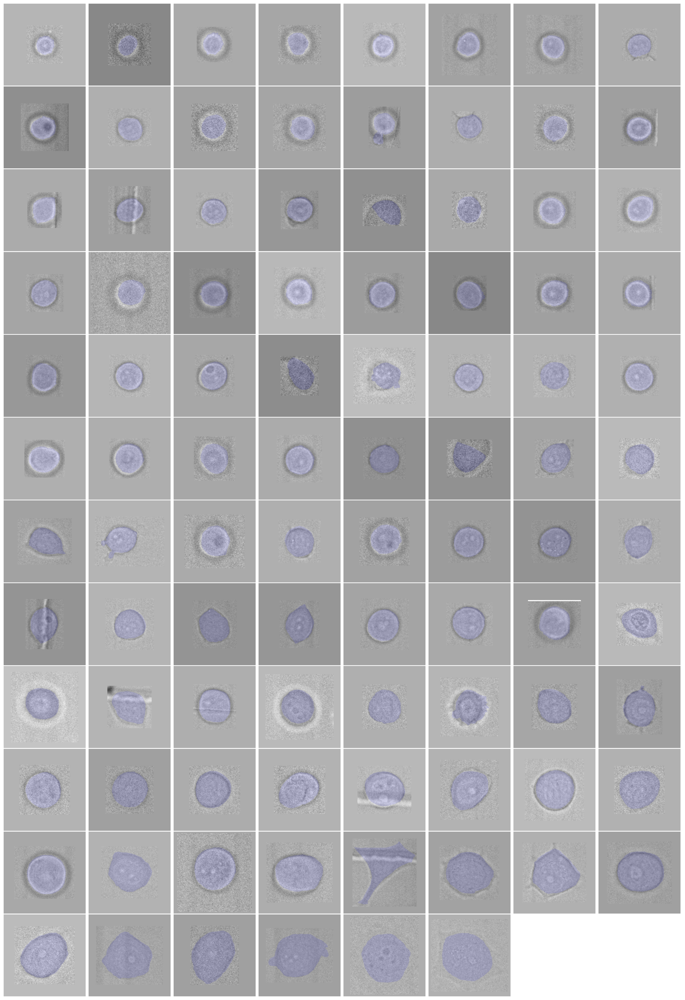

In [37]:
# supplementary figure with all cells
npz_fdn = '/home/yike/phd/cancer_cells_img_seq/figures/segmentation/cancer100cells/'
save_path = '/home/yike/phd/cancer_cells_img_seq/docs/hyperspectral_sequencing_ewa/figures/figure1/'

hn = 8
vn = int(adata.obs.shape[0] / 8) + 1

fig, axs = plt.subplots(vn, hn, figsize=(3 * hn, 3 * vn), 
                        dpi=300, sharex=True, sharey=True)    
rcParams['pdf.fonttype'] = 42
length = 620
plt.subplots_adjust(wspace=0.01, hspace=0.01)

axs = axs.ravel()
for i in range(hn * vn):
    if i in range(adata.obs.shape[0]):
        sample = adata.obs['area'].sort_values().index[i]
        bf, mask = adjusted_cropped_cell(npz_fdn, sample, length).values()
        
        axs[i].imshow(bf) # 
        axs[i].imshow(mask)

#         axs[i].set_title(sample)
    
    axs[i].axis('off')

fig.savefig('/home/yike/phd/cancer_cells_img_seq/docs/hyperspectral_sequencing_ewa/figures/figure2/' + 'supplementary_size.pdf')

--------  0  ---------
--------  1  ---------
--------  2  ---------
--------  3  ---------
--------  4  ---------
--------  5  ---------
--------  6  ---------
--------  7  ---------
--------  8  ---------
--------  9  ---------
--------  10  ---------
--------  11  ---------
--------  12  ---------
--------  13  ---------
--------  14  ---------
--------  15  ---------
--------  16  ---------
--------  17  ---------
--------  18  ---------
--------  19  ---------
--------  20  ---------
--------  21  ---------
--------  22  ---------
--------  23  ---------
--------  24  ---------
--------  25  ---------
--------  26  ---------
--------  27  ---------
--------  28  ---------
--------  29  ---------
--------  30  ---------
--------  31  ---------
--------  32  ---------
--------  33  ---------
--------  34  ---------
--------  35  ---------
--------  36  ---------
--------  37  ---------
--------  38  ---------
--------  39  ---------
--------  40  ---------
--------  41  ---------
--

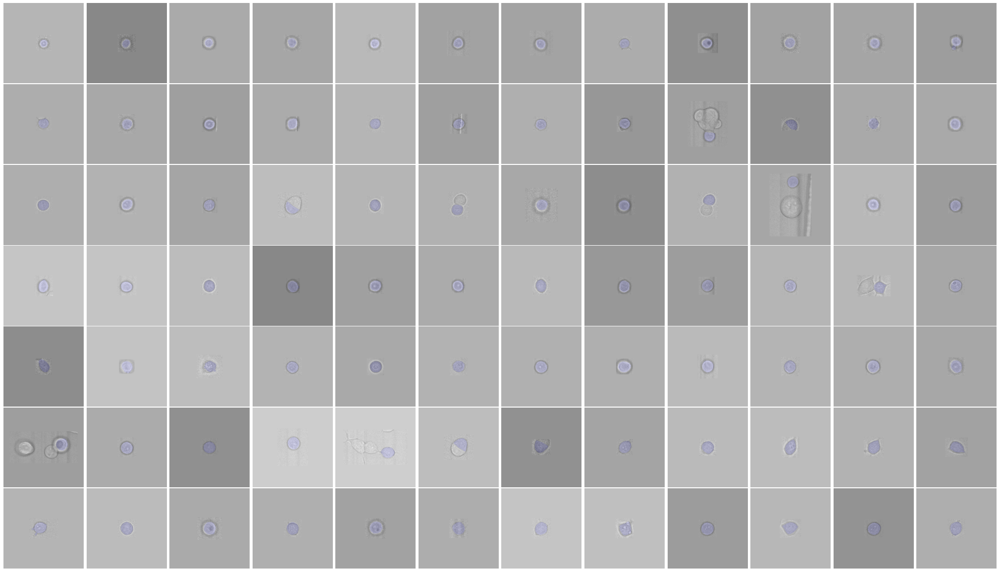

In [8]:
# supplementary figure with all cells
npz_fdn1 = '/home/yike/phd/cancer_cells_img_seq/figures/batch_202112/segmentation/cancer100cells/'
npz_fdn2 = '/home/yike/phd/cancer_cells_img_seq/figures/batch_202306/cropped_cell_npz/good/'

save_path = '/home/yike/phd/cancer_cells_img_seq/docs/hyperspectral_sequencing_ewa/figures/new_batch/Figure3/'

hn = 12
vn = int(84 / hn)

fig, axs = plt.subplots(vn, hn, figsize=(3 * hn, 3 * vn), 
                        sharex=True, sharey=True)    
rcParams['pdf.fonttype'] = 42
length = 1450
plt.subplots_adjust(wspace=0.01, hspace=0.01)

axs = axs.ravel()
for i in range(hn * vn)[:84]:
    print(f'--------  {i}  ---------')
    if i in range(adata.obs.shape[0]):
        sample = adata.obs['area'].sort_values().index[i]
        
        bf, mask = adjusted_cropped_cell([npz_fdn1, npz_fdn2]['3-1' in sample], 
                                         sample[4:], length).values()
        
        axs[i].imshow(bf) # 
        axs[i].imshow(mask)

#         axs[i].set_title(sample)
    
    axs[i].axis('off')

fig.savefig('/home/yike/phd/cancer_cells_img_seq/docs/hyperspectral_sequencing_ewa/figures/new_batch/Figure3/' + 'supplementary_size1.pdf')

--------  0  ---------
--------  1  ---------
--------  2  ---------
--------  3  ---------
--------  4  ---------
--------  5  ---------
--------  6  ---------
--------  7  ---------
--------  8  ---------
--------  9  ---------
--------  10  ---------
--------  11  ---------
--------  12  ---------
--------  13  ---------
--------  14  ---------
--------  15  ---------
--------  16  ---------
--------  17  ---------
--------  18  ---------
--------  19  ---------
--------  20  ---------
--------  21  ---------
--------  22  ---------
--------  23  ---------
--------  24  ---------
--------  25  ---------
--------  26  ---------
--------  27  ---------
--------  28  ---------
--------  29  ---------
--------  30  ---------
--------  31  ---------
--------  32  ---------
--------  33  ---------
--------  34  ---------
--------  35  ---------
--------  36  ---------
--------  37  ---------
--------  38  ---------
--------  39  ---------
--------  40  ---------
--------  41  ---------
--

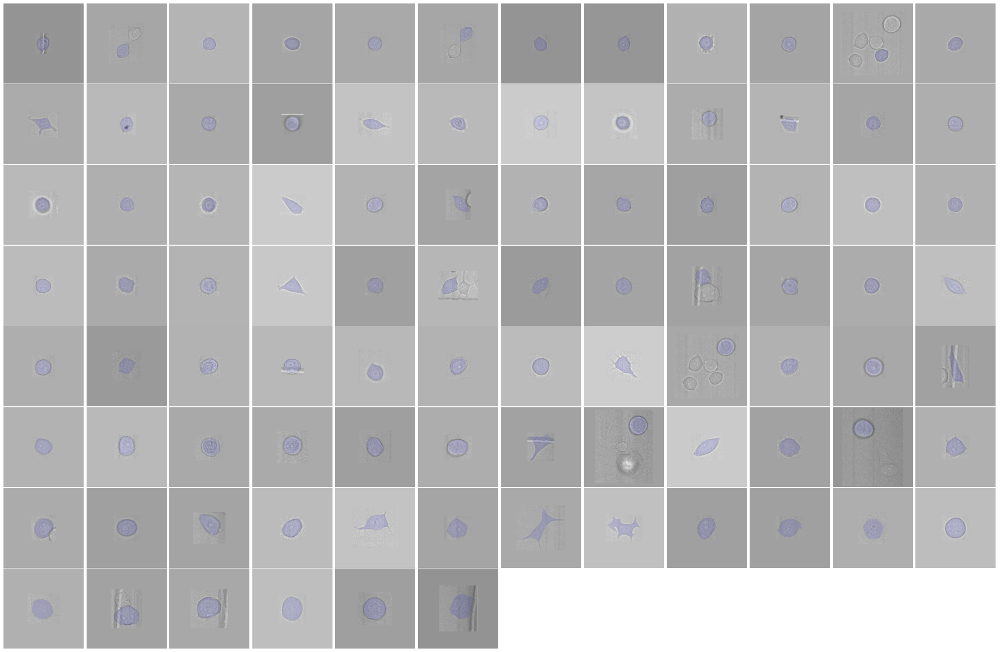

In [10]:
hn = 12
vn = int((adata.obs.shape[0] - 84) / hn) + 1

fig, axs = plt.subplots(vn, hn, figsize=(3 * hn, 3 * vn), 
                        sharex=True, sharey=True)    
rcParams['pdf.fonttype'] = 42
length = 1450
plt.subplots_adjust(wspace=0.01, hspace=0.01)

axs = axs.ravel()
for i in range(hn * vn):
    print(f'--------  {i}  ---------')
    if i in range(adata.obs.shape[0] - 84):
        sample = adata.obs['area'].sort_values().index[84 + i]
        
        bf, mask = adjusted_cropped_cell([npz_fdn1, npz_fdn2]['3-1' in sample], 
                                         sample[4:], length).values()
        
        axs[i].imshow(bf) # 
        axs[i].imshow(mask)

#         axs[i].set_title(sample)
    
    axs[i].axis('off')

fig.savefig('/home/yike/phd/cancer_cells_img_seq/docs/hyperspectral_sequencing_ewa/figures/new_batch/Figure3/' + 'supplementary_size2.pdf')